<a href="https://colab.research.google.com/github/Adjaro/50-projects-for-react-and-the-static-web/blob/master/Tesseract.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pillow
!pip install pytesseract
!pip install tesserocr

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 14.3 MB/s eta 0:00:00


In [2]:
!sudo apt install tesseract-ocr-fra

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-fra tesseract-ocr-osd
0 upgraded, 4 newly installed, 0 to remove and 45 not upgraded.
Need to get 5,344 kB of archives.
After this operation, 16.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Get:4 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-fra all 1:4.00~git30-7274cfa-1.1 [527 kB]
Fetched 5,344 kB in 1s (5,261 kB/s)
debconf: unable to ini

## Récupération des données.

In [3]:
# %%capture
!apt-get install -y poppler-utils

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  poppler-utils
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 186 kB of archives.
After this operation, 696 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 poppler-utils amd64 22.02.0-2ubuntu0.3 [186 kB]
Fetched 186 kB in 1s (369 kB/s)
Selecting previously unselected package poppler-utils.
(Reading database ... 121803 files and directories currently installed.)
Preparing to unpack .../poppler-utils_22.02.0-2ubuntu0.3_amd64.deb ...
Unpacking poppler-utils (22.02.0-2ubuntu0.3) ...
Setting up poppler-utils (22.02.0-2ubuntu0.3) ...
Processing triggers for man-db (2.10.2-1) ...


In [4]:
# %%capture
!pip  install  pdf2image
!pip  install  pillow

In [5]:
import subprocess
import glob
import os
import requests

In [6]:
r = requests.get("https://geode.liris.cnrs.fr/Trevoux/datasets/1704/pdf/GoogleBooks_Dictionnaire_universel_fran%c3%a7ois_latin_tome1.pdf")
with open("dictionnaire.pdf", 'wb') as fp:
    fp.write(r.content)

***Les données étant très grandes, nous allons récupérer seulement une partie entre les pages 50 et 55 pour l'instant afin de faire les tests sur nos modèles.***

In [7]:
import pdf2image

from pdf2image.exceptions import (
    PDFInfoNotInstalledError,
    PDFPageCountError,
    PDFSyntaxError
)

def convert_pdf_to_images(pdf_path,  debut ,fin ):
    try:
        images = pdf2image.convert_from_path(pdf_path , first_page=debut , last_page=fin )

    except (PDFInfoNotInstalledError, PDFSyntaxError) as e:
        print("Failed to convert pdf to image: ", e)

    if(images):
      return images
    else:
      return  None

# Call the function with your pdf path and output folder
images = convert_pdf_to_images('/content/dictionnaire.pdf' ,1,51)


In [8]:
# import the necessary packages
from PIL import Image
import pytesseract
import argparse
import cv2
import os

In [9]:
pytesseract.tesseract_cmd = (
    r'/usr/bin/tesseract'
)

images[5].save('temp.png')
image = cv2.imread('temp.png')


text = pytesseract.image_to_string(image, lang='fra')

with open('test.txt', 'w') as f:
    f.write(text)

In [10]:
res = pytesseract.image_to_pdf_or_hocr(image,extension='hocr' ,lang='fra')

with open('test.hocr', 'w+b') as f:
    f.write(res)


In [11]:
!tesseract --help-oem
!tesseract --help-psm

OCR Engine modes: (see https://github.com/tesseract-ocr/tesseract/wiki#linux)
  0    Legacy engine only.
  1    Neural nets LSTM engine only.
  2    Legacy + LSTM engines.
  3    Default, based on what is available.
Page segmentation modes:
  0    Orientation and script detection (OSD) only.
  1    Automatic page segmentation with OSD.
  2    Automatic page segmentation, but no OSD, or OCR. (not implemented)
  3    Fully automatic page segmentation, but no OSD. (Default)
  4    Assume a single column of text of variable sizes.
  5    Assume a single uniform block of vertically aligned text.
  6    Assume a single uniform block of text.
  7    Treat the image as a single text line.
  8    Treat the image as a single word.
  9    Treat the image as a single word in a circle.
 10    Treat the image as a single character.
 11    Sparse text. Find as much text as possible in no particular order.
 12    Sparse text with OSD.
 13    Raw line. Treat the image as a single text line,
       bypa

In [12]:
import matplotlib.pyplot as plt
from PIL import Image

In [13]:
import cv2
import numpy as np
from pytesseract import Output

# Charger l'image
images[39].save('temp.png')
img = cv2.imread('temp.png')

custom_oem_psm_config = r'--oem 3 --psm 3'
d = pytesseract.image_to_data(img, lang='fra', output_type=Output.DICT, config=custom_oem_psm_config)

image = np.ones_like(img) * 255

for i in range(len(d['text'])):
    x, y, w, h = d['left'][i], d['top'][i], d['width'][i], d['height'][i]
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image, d['text'][i], (x, y-5  ), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

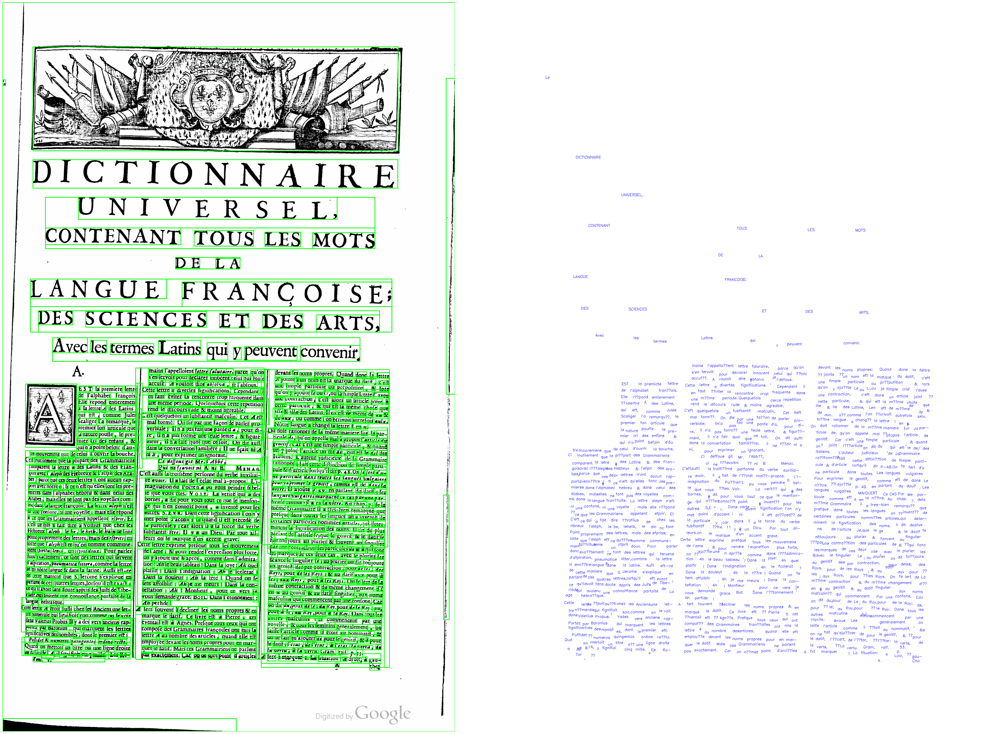

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(50,50))

axes[0].imshow(img)
axes[0].axis('off')

axes[1].imshow(image)
axes[1].axis('off')

plt.show()


In [15]:
import cv2
import numpy as np
from pytesseract import Output

# Charger l'image
images[50].save('temp.png')
img = cv2.imread('temp.png')

custom_oem_psm_config = r'--oem 3 --psm 3'
d = pytesseract.image_to_data(img, lang='fra', output_type=Output.DICT, config=custom_oem_psm_config)

image = np.ones_like(img) * 255

for i in range(len(d['text'])):
    x, y, w, h = d['left'][i], d['top'][i], d['width'][i], d['height'][i]
    cv2.rectangle(img, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(image, d['text'][i], (x, y-5  ), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

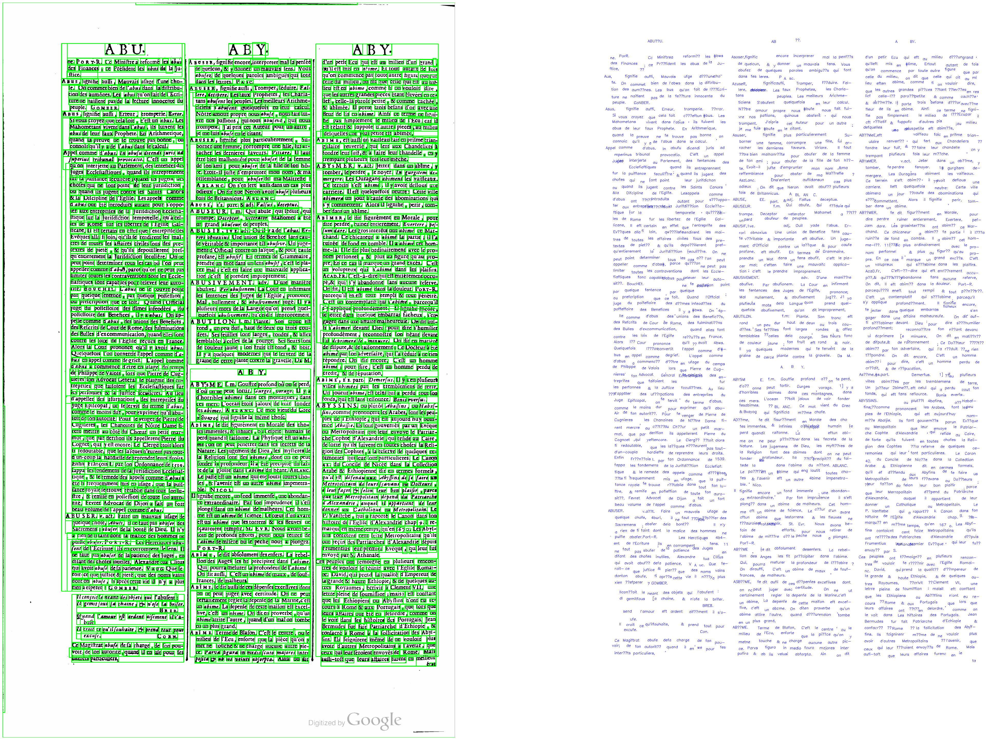

In [17]:
fig, axes = plt.subplots(1, 2, figsize=(50,50))

axes[0].imshow(img)
axes[0].axis('off')

axes[1].imshow(image)
axes[1].axis('off')

plt.show()
